# 1.Set Environment & Libraries

In [ ]:
# Set an environment for geopandas & other geo-related libraries

# Aclima/Purple Air

%%time

# Important library for many geopython libraries
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirment
!pip install descartes

# Geo-related libraries
!pip install geopandas
!pip install osmnx
!pip install contextily
!pip install folium
!pip install plotly_express
!pip install geofeather

# Others
!pip install matplotlib==3.1.3

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package python-gdal is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source
However the following packages replace it:
  gdal-bin

E: Package 'python-gdal' has no installation candidate
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6
The following NEW packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6 python3-rtree
0 upgraded, 4 newly installed, 0 to remove and 29 not upgraded.
Need to get 365 kB of archives.
After this operation, 1,799 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex6 amd64 1.9.3-2 [247 kB]
Get:2 http://archive

CPU times: user 2.2 s, sys: 324 ms, total: 2.53 s
Wall time: 5min 10s


In [ ]:
# Data manipulation libraries
import os
import pandas as pd
import numpy as np

# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Timer
from tqdm import tqdm, tqdm_notebook


# Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor


# Model support functions
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
from pprint import pprint
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 2.Load Data

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials


auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

link = 'https://drive.google.com/open?id=1TOVP_oHSm6ItVjpKgHzHr0ESJqnfnvkO'
fluff, id = link.split('=')
file = drive.CreateFile({'id':id})
file.GetContentFile('Home_n_Map.csv')

In [ ]:
# Read air pollutant & health info
df_1 = pd.read_csv("Home_n_Map.csv")
df_1.head(5)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
# Check a null counts and data types
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [ ]:
# Mapping the data points
# (a) convert pandas df --> geopandas df (based on latitude & longitude) --> epsg:4326 == degree

gpd_1_degree = gpd.GeoDataFrame(df_1, geometry=gpd.points_from_xy(df_1.Longitude, df_1.Latitude), crs={'init' :'epsg:4326'})
gpd_1_degree.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


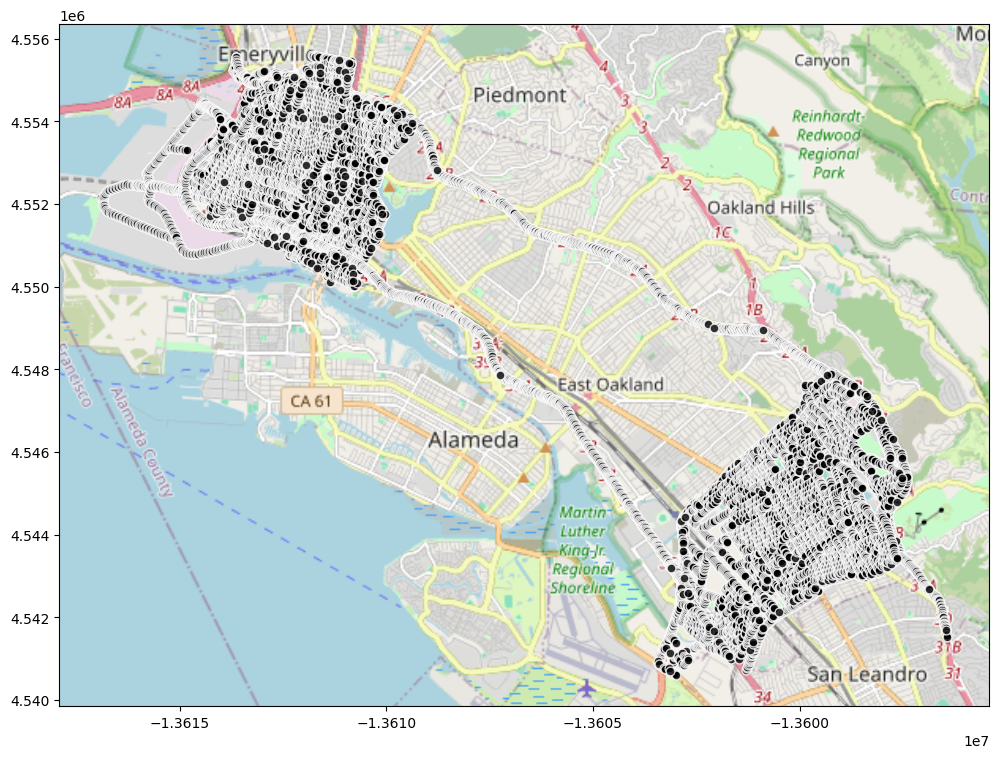

In [ ]:
# Mapping the data points
# (b) draw a figure

fig, ax = plt.subplots(figsize=(12, 10))
gpd_1_degree.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="black",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
# fig.savefig('output/file_name', dpi = 400, transparent = True)

# 3.Data Cleaning

In [ ]:
# Check dataframe
df_1.head(2)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


## Rename

In [ ]:
# Rename (replacing 'NO value' to 'NO')
df_1 = df_1.rename(columns={'NO value': 'NO'})

# Rename (replacing 'NO2 value' to 'NO')
df_1 = df_1.rename(columns={'NO2 value': 'NO2'})

# Rename (replacing 'NO value' to 'NO')
df_1 = df_1.rename(columns={'PM2p5 value': 'PM2p5'})

# EDF_points = EDF_points.rename(index=str, columns={"NO Value": "NO", "NO2 Value": "NO2", "PM2p5 Value": "PM2p5"})

## Drop Irrelevant Feature

In [ ]:
# count unique values for each feature - do this step bf missing data， preveting unnecessary filters
print("*** Cnts of Each Feature ***")
print(df_1.nunique())

*** Cnts of Each Feature ***
NO                16015
NO2               18226
PM2p5             18281
geometry          18281
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18129
Latitude          18257
Respiratory_HI        3
Pt_CANCR              3
dtype: int64


In [ ]:
df_1.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


In [ ]:
# Drop columns (features)
df_1_drop = df_1.drop(['state', 'county', 'tract_name', 'GEOID'], axis=1)

df_1_drop.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


## Missing Data

In [ ]:
# (0) Size of data
print ("Num of rows: " + str(df_1_drop.shape[0])) # row count
print ("Num of columns: " + str(df_1_drop.shape[1])) # col count

Num of rows: 18286
Num of columns: 13


In [ ]:
# (1) Check missing data
print("*** Missing Values ***")
print('Sum of N/A values', df_1_drop.isnull().sum())

*** Missing Values ***
Sum of N/A values NO                 0
NO2                0
PM2p5              0
geometry           0
road_type          0
zone              48
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64


In [ ]:
# (2) Choose a method of handling the missing data - drop all N/A?  avg?  front fill?   back fill? med? mean?
# Dropping Rows with Missing Data in Specific Columns  ['zone', 'wind', 'temp']
df_1_miss = df_1_drop.dropna(axis=0, subset=['zone', 'wind', 'temp'])

df_1_miss.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18285,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
# (3) Reset index
df_1_miss = df_1_miss.reset_index()

# (4) Check info
df_1_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18222 entries, 0 to 18221
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           18222 non-null  int64  
 1   NO              18222 non-null  float64
 2   NO2             18222 non-null  float64
 3   PM2p5           18222 non-null  float64
 4   geometry        18222 non-null  object 
 5   road_type       18222 non-null  object 
 6   zone            18222 non-null  object 
 7   pop_den         18222 non-null  float64
 8   wind            18222 non-null  float64
 9   temp            18222 non-null  float64
 10  Longitude       18222 non-null  float64
 11  Latitude        18222 non-null  float64
 12  Respiratory_HI  18222 non-null  object 
 13  Pt_CANCR        18222 non-null  object 
dtypes: float64(8), int64(1), object(5)
memory usage: 1.9+ MB


In [ ]:
# (5) Remove index
df_1_miss = df_1_miss.drop(['index'], axis=1)

## Duplicated values

In [ ]:
# (0) Size of data
print ("Num of rows: " + str(df_1_miss.shape[0])) # row count
print ("Num of columns: " + str(df_1_miss.shape[1])) # col count

Num of rows: 18222
Num of columns: 13


In [ ]:
# (1) Extract duplicated row
df_1_miss[df_1_miss.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
174,32.059862,24.190178,19.514652,POINT (-122.308528 37.81502824),secondary,industrial,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
504,16.426667,19.134740,18.727645,POINT (-122.3001287 37.80641093),secondary,mixed,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7161,92.638344,45.426999,28.987625,POINT (-122.233788 37.77509246),motorway,mixed,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


In [ ]:
# (2) Print the first & last rows BEFORE removing duplicated values
df_1_miss.iloc[[0,-1]]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
# # Remove duplicated row
# # (method one) keep='first' -> the first occurrence gets kept, and all others get identified as duplicates.
# new = df.drop_duplicates(subset=['column1'], keep='first', inplace=False)
# # (method two) keep='last' -> the last occurrence gets kept, and all others get identified as duplicates.
# new = df.drop_duplicates(subset=['column1'], keep='last', inplace=False)
# # (method three) keep='False' -> remove all duplicates
# new = df.drop_duplicates(subset=['column1'], keep='false', inplace=False)


# (3) Remove duplicated values
df_1_dup = df_1_miss.drop_duplicates()
df_1_dup.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18220,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
# (4) Reset index, creating a new df
df_1_dup.reset_index(inplace=True)
# (5) Check duplicated values
df_1_dup[df_1_dup.duplicated()]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


In [ ]:
# (6) Print the first & last rows AFTER removing duplicated values
df_1_dup.iloc[[0,-1]]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18218,18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


## Outliers

In [ ]:
# Copy
df_1_out = df_1_dup.copy()

df_1_out.head(1)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.6127,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8


<Axes: ylabel='temp'>

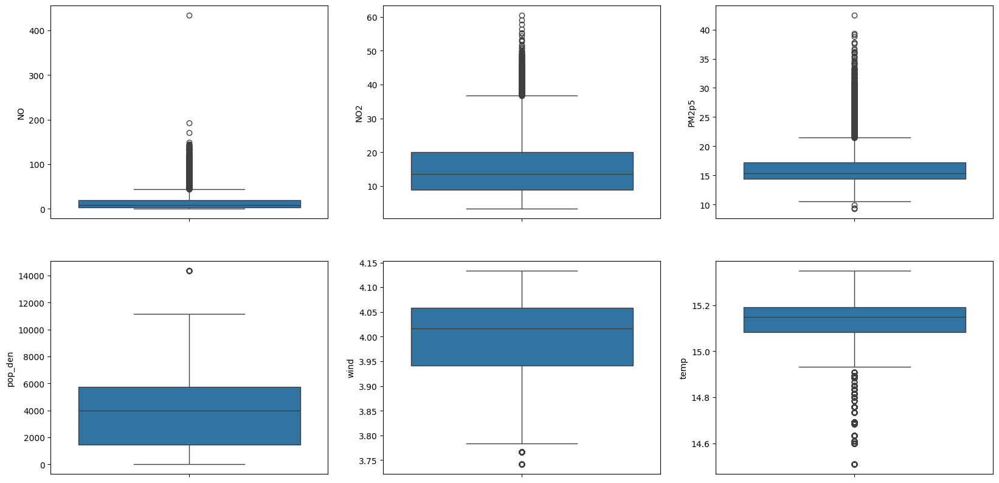

In [ ]:
# Checking outliers

_,axss = plt.subplots(2,3, figsize=[20,10])  # create a 2x3 matrix = 6 figures
sns.boxplot(y ='NO', data=df_1_out, ax=axss[0, 0])
sns.boxplot(y ='NO2', data=df_1_out, ax=axss[0, 1])
sns.boxplot(y ='PM2p5', data=df_1_out, ax=axss[0, 2])
sns.boxplot(y ='pop_den', data=df_1_out, ax=axss[1][0])
sns.boxplot(y ='wind', data=df_1_out, ax=axss[1][1])
sns.boxplot(y ='temp', data=df_1_out, ax=axss[1][2])

In [ ]:
# Mannually remove outliers based on knowledge
# if NO > 200 -> let all of them equl to 200
df_1_out.loc[df_1_out['NO'] > 200, 'NO'] = 200

# 4.Feature Engineering

## Oakland city

In [ ]:
# Import oakland street and map data
Oakland_poly = ox.geocode_to_gdf('Oakland, California')

Oakland_poly

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"POLYGON ((-122.35588 37.83573, -122.35009 37.8...",37.885426,37.633676,-122.11442,-122.355881,314446251,relation,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."


<Axes: >

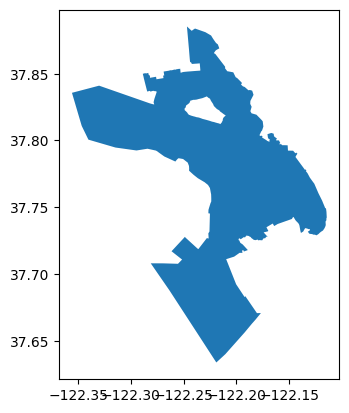

In [ ]:
Oakland_poly.plot()

### convert geo

In [ ]:
from shapely import wkt

# Convert WKT to shapely geometry objects
df_1_out['geometry'] = df_1_out['geometry'].apply(wkt.loads)

# Create the GeoDataFrame with the correct CRS definition
gpd_1_degree = gpd.GeoDataFrame(df_1_out, geometry='geometry', crs='EPSG:4326')

# Check CRS for both GeoDataFrames
print(Oakland_poly.crs, gpd_1_degree.crs)

epsg:4326 EPSG:4326


In [ ]:
gpd_1_degree.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


### Spatial-join

In [ ]:
# spatial-join the dataset of pollutant and health with the Oakland polygon grid (make sure all data represent Oakland city)
gpd_1_city = gpd.sjoin(gpd_1_degree, Oakland_poly, how="inner", op="intersects")

gpd_1_city.head(2)

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."


In [ ]:
# count unique values for each feature
print("*** Cnts of Each Feature ***")
print(gpd_1_city.nunique())

*** Cnts of Each Feature ***
index             18217
NO                15961
NO2               18161
PM2p5             18215
geometry          18215
road_type             6
zone                  5
pop_den              70
wind                 45
temp                 80
Longitude         18065
Latitude          18192
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_north            1
bbox_south            1
bbox_east             1
bbox_west             1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
class                 1
type                  1
place_rank            1
importance            1
addresstype           1
name                  1
display_name          1
dtype: int64


In [ ]:
gpd_1_city = gpd_1_city.drop(['index_right', 'bbox_east', 'bbox_north', 'bbox_south', 'bbox_west'], axis=1)

## City structure: Roads

### city

In [ ]:
# (1) grab street data (roads and intersections) for entire city
oak_streets = ox.graph_from_place('Oakland, California', network_type = 'drive')
nodes, edges = ox.graph_to_gdfs(oak_streets)

In [ ]:
nodes.head(1)

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
30362160,37.824005,-122.303118,motorway_junction,3,NaN,POINT (-122.30312 37.82400)


In [ ]:
edges.head(1)

,,,osmid,bridge,oneway,lanes,highway,maxspeed,reversed,length,geometry,ref,name,tunnel,junction,access,width
u,v,key,,,,,,,,,,,,,,,
30362160,30365945,0,"[4757680, 781148889, 710721718]",yes,True,"[2, 1]",motorway_link,55 mph,False,741.848,"LINESTRING (-122.30312 37.82400, -122.30418 37...",NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

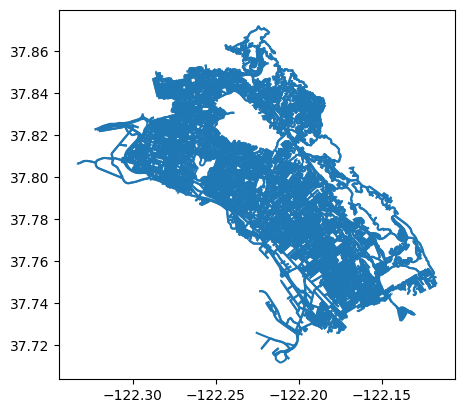

In [ ]:
edges.plot()

### road

In [ ]:
# (2 - a) Identify roads
oakland_rds = edges.copy()
print(oakland_rds['highway'].value_counts())
print ("Num of rows: " + str(oakland_rds.shape[0])) # row count
print ("Num of columns: " + str(oakland_rds.shape[1])) # col count

residential                        14921
secondary                           2890
tertiary                            2487
primary                              777
motorway_link                        325
unclassified                         242
motorway                             206
secondary_link                        96
trunk                                 62
tertiary_link                         41
trunk_link                            39
living_street                         24
primary_link                          17
[residential, unclassified]            4
[residential, living_street]           2
[motorway, motorway_link]              2
[secondary_link, motorway_link]        2
Name: highway, dtype: int64
Num of rows: 22137
Num of columns: 15


In [ ]:
# (2 - b) Clean roads

# remove '_link' in xxx_link & add it to xxx
# (e.g., motorway_link is added on motorway )
oakland_rds['highway'] = oakland_rds['highway'].str.replace('_link', '')


# 'trunk'  -->  'secondary'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'trunk', 'secondary', oakland_rds['highway'])


# 'living_street' --> 'residential'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'living_street', 'residential', oakland_rds['highway'])

# Check results
print(oakland_rds['highway'].value_counts())

residential     14945
secondary        3087
tertiary         2528
primary           794
motorway          531
unclassified      242
Name: highway, dtype: int64


<Axes: xlabel='highway', ylabel='count'>

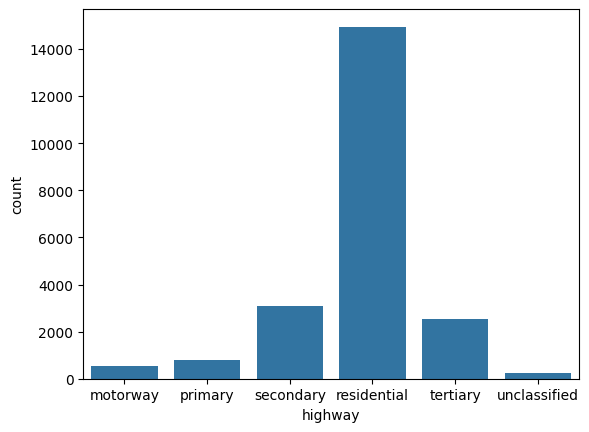

In [ ]:
# Reset the index to a single index to avoid the error of 'MultiIndex' object has no attribute '_data'
oakland_rds_reset = oakland_rds.reset_index(drop=True)
sns.countplot(data=oakland_rds_reset, x='highway')
#sns.countplot(oakland_rds['highway'])

### map

In [ ]:
# (3) Map them out

# grab subsets of roadtypes
oakland_highways = oakland_rds[oakland_rds.highway == 'motorway']
oakland_primary = oakland_rds[oakland_rds.highway == 'primary']
oakland_secondary = oakland_rds[oakland_rds.highway == 'secondary']
oakland_tertiary = oakland_rds[oakland_rds.highway == 'tertiary']
oakland_resid = oakland_rds[oakland_rds.highway == 'residential']

oakland_highways.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

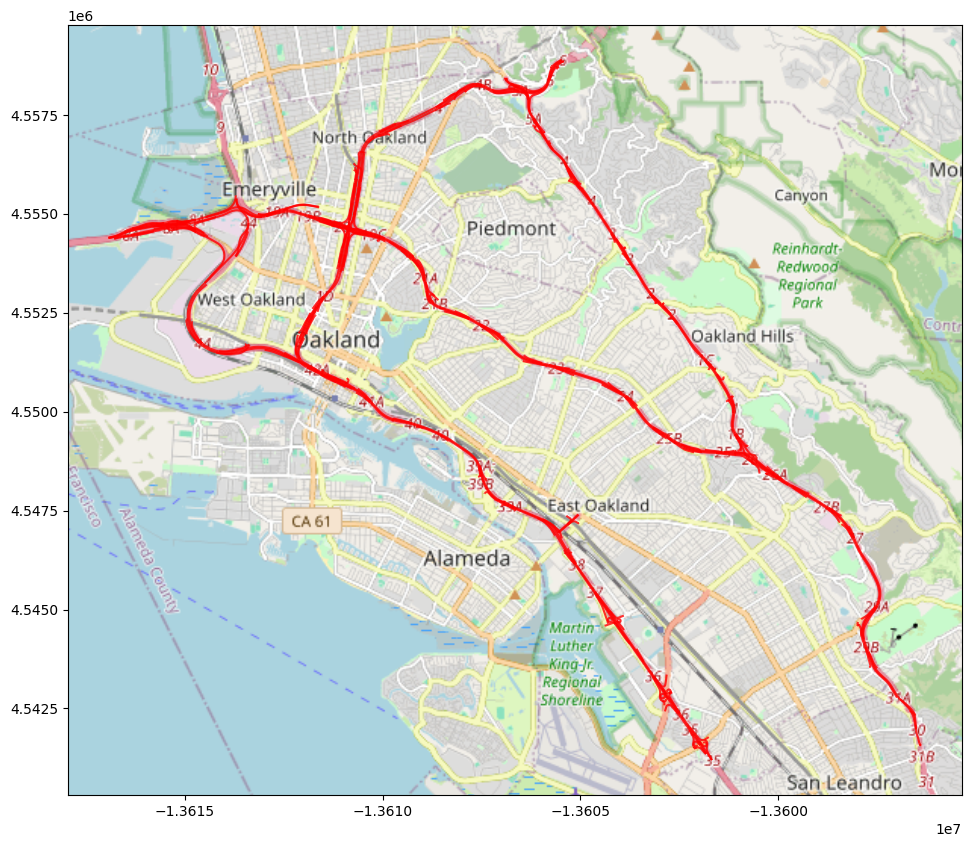

In [ ]:
# Highway
fig, ax = plt.subplots(figsize=(12, 10))
oakland_highways.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="red",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

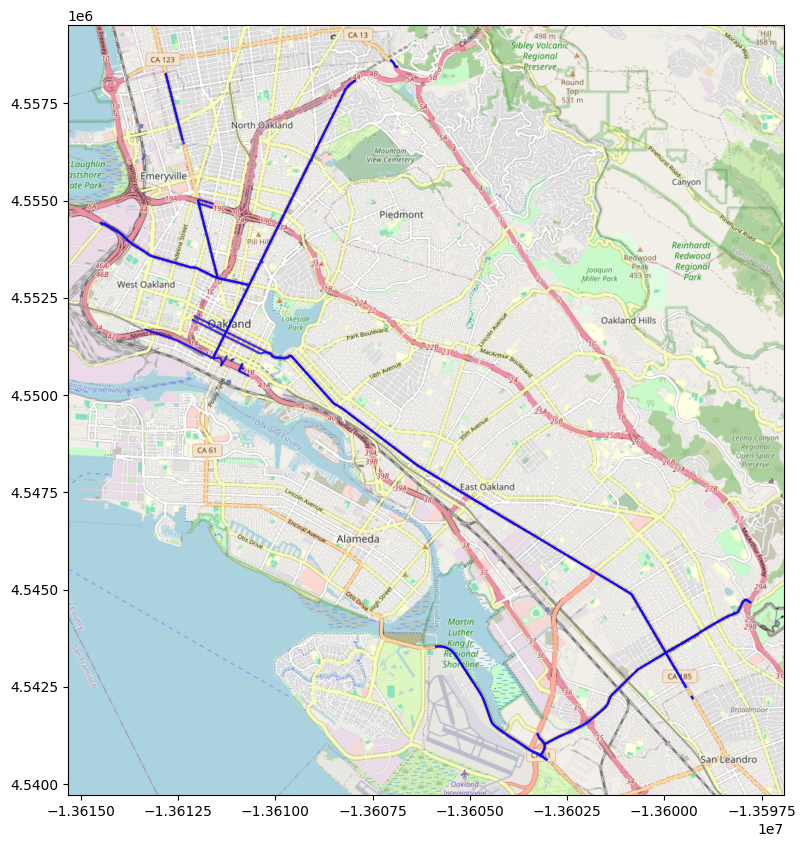

In [ ]:
# Primary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

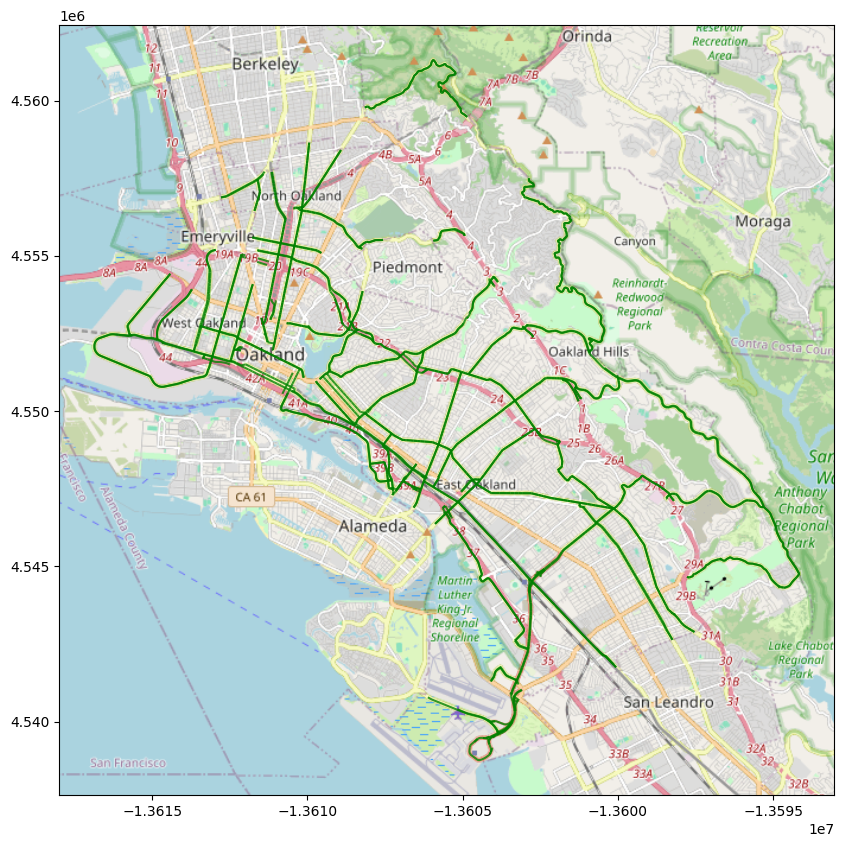

In [ ]:
# Secondary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

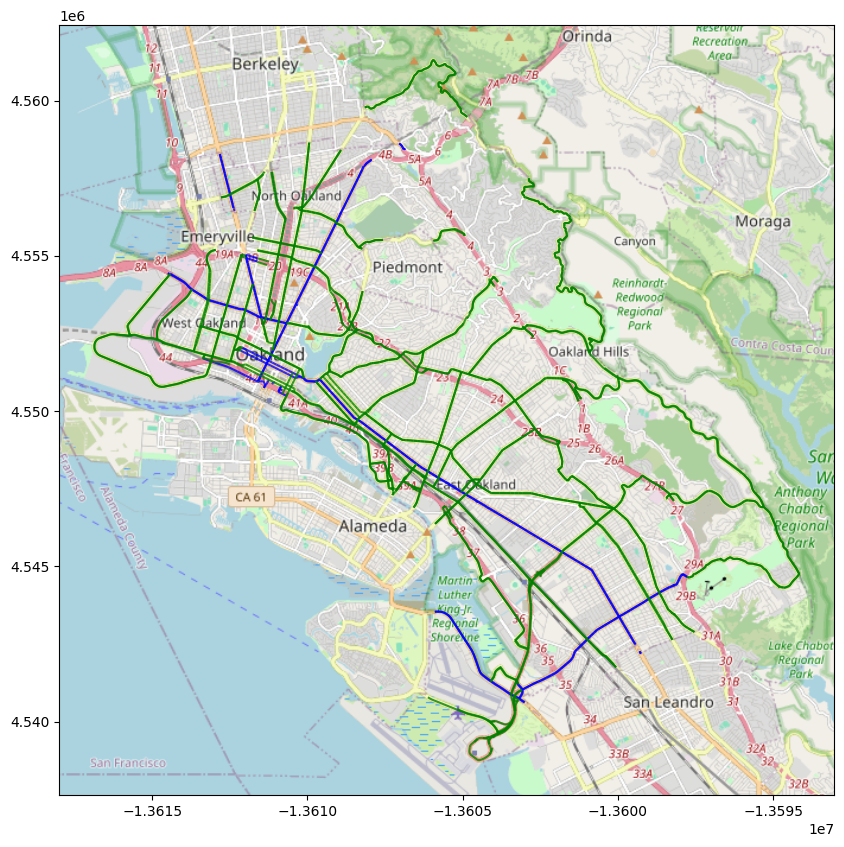

In [ ]:
# Primary & Secondary

fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

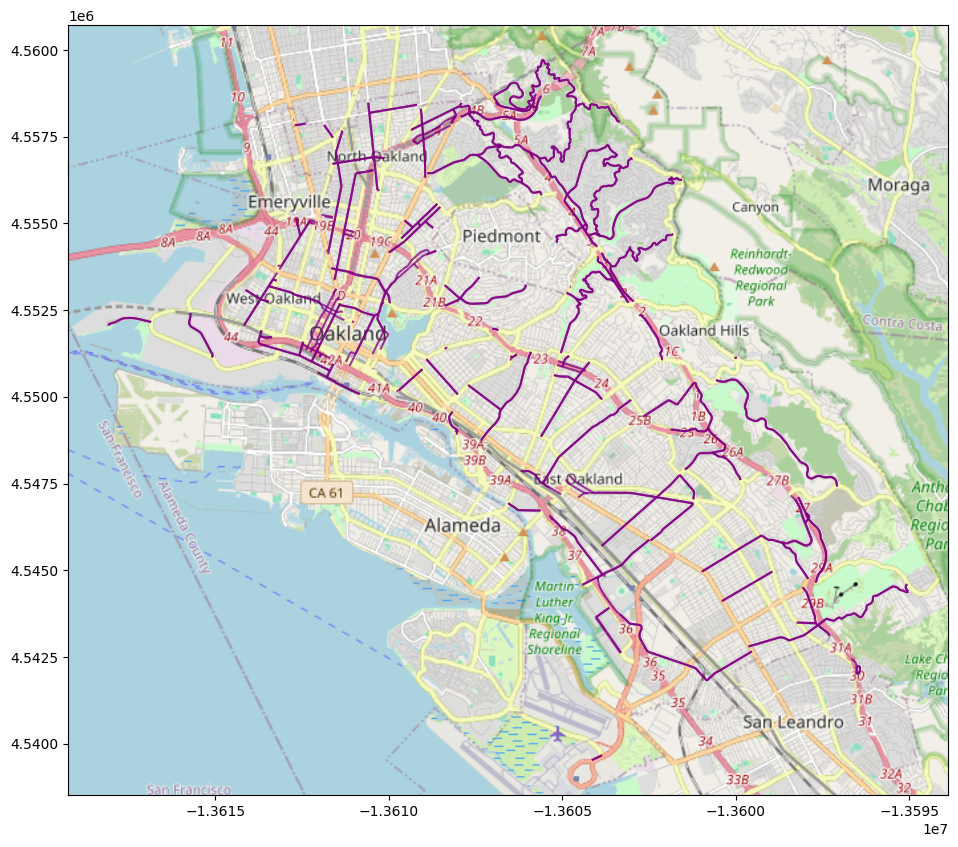

In [ ]:
# Tertiary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_tertiary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="purple",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

### road distance

In [ ]:
gpd_1_city.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Conver geometey from degree -> meter (utm: unit in meter)
# 'epsg:32610' == meter
# 'epsg:4326' == degree
gpd_1_city_utm = gpd_1_city.to_crs({'init': 'epsg:32610'}).copy()      # much faster to do the re-projection to meters
highway_utm = oakland_highways.to_crs({'init': 'epsg:32610'}).copy()
primary_utm = oakland_primary.to_crs({'init': 'epsg:32610'}).copy()
secondary_utm = oakland_secondary.to_crs({'init': 'epsg:32610'}).copy()
tertiary_utm = oakland_tertiary.to_crs({'init': 'epsg:32610'}).copy()


# UDF
def distance_to_roadway(gps, roadway):
    '''Calculate distance from GPS point to nearest road line polygon'''
    dists = []
    for i in roadway.geometry:
        dists.append(i.distance(gps))
    return(np.min(dists))


# # Calculate distance to nearest major roadway
# gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = highway_utm)
# gpd_1_city['closest_primary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = primary_utm)
# gpd_1_city['closest_secondary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = secondary_utm)
# gpd_1_city['closest_tertiary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = tertiary_utm)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
# Calculate distance to nearest highway
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = highway_utm)
# gpd_1_city['closest_highway'] = gpd_1_city['geometry'].apply(distance_to_roadway, roadway = highway_utm)

100%|██████████| 18217/18217 [02:57<00:00, 102.45it/s]


In [ ]:
# Calculate distance to nearest primary road
tqdm.pandas()
gpd_1_city['closest_primary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = primary_utm)

100%|██████████| 18217/18217 [04:20<00:00, 69.94it/s]


In [ ]:
# Calculate distance to nearest secondary road
tqdm.pandas()
gpd_1_city['closest_secondary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = secondary_utm)

100%|██████████| 18217/18217 [16:18<00:00, 18.61it/s]


In [ ]:
# Calculate distance to nearest tertiary road
tqdm.pandas()
gpd_1_city['closest_tertiary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = tertiary_utm)

100%|██████████| 18217/18217 [13:14<00:00, 22.94it/s]


In [ ]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,type,place_rank,importance,addresstype,name,display_name,closest_highway,closest_primary,closest_secondary,closest_tertiary
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St...",1529.354679,2576.575272,3.000134e+01,0.003395
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St...",1510.616902,2605.774822,5.010205e-08,63.387249


## City Structure: traffic signal & stop sign

### identify

In [ ]:
# (1) Identify traffic signals & stop signs
nodes['highway'].value_counts()

traffic_signals      789
stop                 367
turning_circle       319
motorway_junction    135
crossing              10
mini_roundabout        4
trailhead              3
turning_loop           1
Name: highway, dtype: int64

In [ ]:
nodes.head(2)

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
30362160,37.824005,-122.303118,motorway_junction,3,NaN,POINT (-122.30312 37.82400)
30362888,37.825844,-122.303049,motorway_junction,3,8A,POINT (-122.30305 37.82584)


In [ ]:
nodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### map

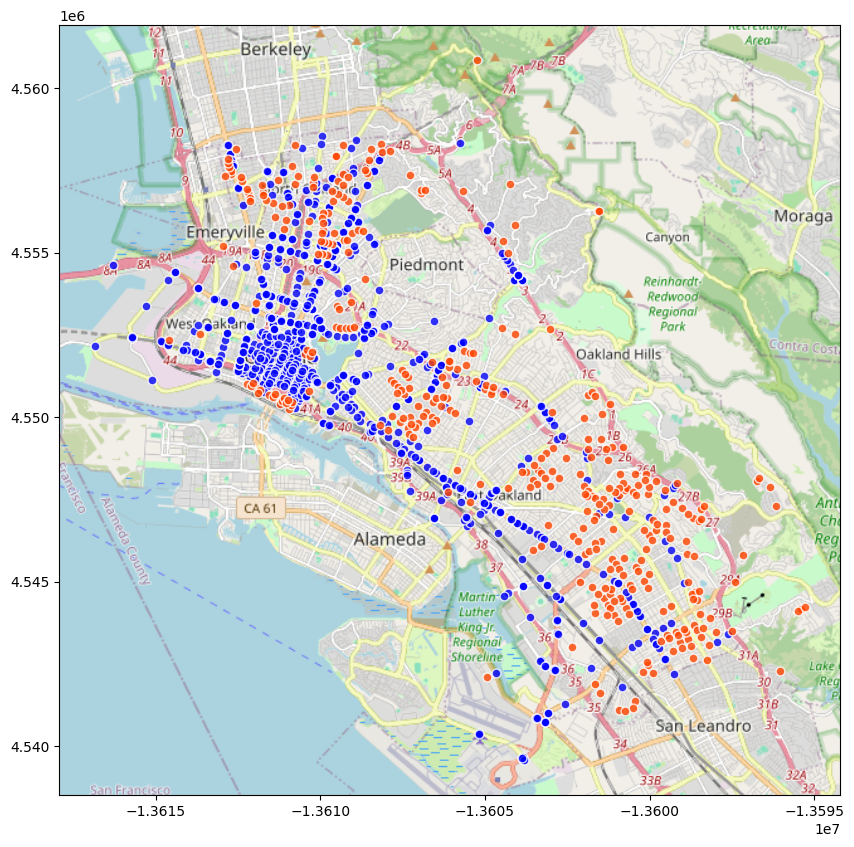

In [ ]:
# (2) Map them out

trafic_signals = nodes[nodes['highway'] == 'traffic_signals']
stop_cross = nodes[nodes['highway'] == 'stop']


# Traffic signal: blue
# Stop sign: red
fig, ax = plt.subplots(figsize=(12, 10))
trafic_signals.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
stop_cross.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="orangered",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

### intersection & traffic signal

In [ ]:
# (3 - a) Conver geometey from degree -> meter (utm: unit in meter)
# 'epsg:32610' == meter
# 'epsg:4326' == degree
traffic_sig_utm = trafic_signals.to_crs({'init': 'epsg:32610'}).copy()    # much faster to do the re-projection to meters
stop_sign_utm = stop_cross.to_crs({'init': 'epsg:32610'}).copy()


# (3 - b) set UDF

def nearest_intersection(gps, intersections):
    ''' Calculates distance from GPS point to nearest intersection'''
    closest_point = nearest_points(gps, MultiPoint(intersections.values))[1]
    return(gps.distance(closest_point))

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
# (3 - c) Calculate distance to nearest traffic signal
tqdm.pandas()
gpd_1_city['trafic_signal_dist'] = gpd_1_city_utm['geometry'].progress_apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])
# gpd_1_city['trafic_signal_dist'] = gpd_1_city['geometry'].apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])

100%|██████████| 18217/18217 [03:14<00:00, 93.71it/s] 


In [ ]:
# (3 - c) Calculate distance to nearest traffic signal
tqdm.pandas()
gpd_1_city['stop_sign_dist'] = gpd_1_city_utm['geometry'].progress_apply(nearest_intersection, intersections = stop_sign_utm['geometry'])

100%|██████████| 18217/18217 [01:30<00:00, 201.18it/s]


## Category Encoding

In [ ]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,importance,addresstype,name,display_name,closest_highway,closest_primary,closest_secondary,closest_tertiary,trafic_signal_dist,stop_sign_dist
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,0.631796,city,Oakland,"Oakland, Alameda County, California, United St...",1529.354679,2576.575272,3.000134e+01,0.003395,30.001344,1818.142667
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,0.631796,city,Oakland,"Oakland, Alameda County, California, United St...",1510.616902,2605.774822,5.010205e-08,63.387249,63.387249,1800.106387


In [ ]:
zone = gpd_1_city['zone']
road_type = gpd_1_city['road_type']

In [ ]:
# One-hot encoding: convert category features to numerical features（0 & 1） - spliting into diff columns
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['road_type'], drop_first=False)      # drop_first=False: do not remove a lable to reduce multicollision
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['zone'], drop_first=False)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,0,0,0,1,0,0,1,0,0,0
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,0,0,1,0,0,0,1,0,0,0


In [ ]:
# Merge them back - for visualization
# axis = 1: rows invariant，but features increased
gpd_1_city = pd.concat([gpd_1_city, zone], axis = 1)
gpd_1_city = pd.concat([gpd_1_city, road_type], axis = 1)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,1,0,0,0,1,0,0,0,industrial,secondary


## Data Preparation

In [ ]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18217 entries, 0 to 18218
Data columns (total 43 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   index                   18217 non-null  int64   
 1   NO                      18217 non-null  float64 
 2   NO2                     18217 non-null  float64 
 3   PM2p5                   18217 non-null  float64 
 4   geometry                18217 non-null  geometry
 5   pop_den                 18217 non-null  float64 
 6   wind                    18217 non-null  float64 
 7   temp                    18217 non-null  float64 
 8   Longitude               18217 non-null  float64 
 9   Latitude                18217 non-null  float64 
 10  Respiratory_HI          18217 non-null  object  
 11  Pt_CANCR                18217 non-null  object  
 12  place_id                18217 non-null  int64   
 13  osm_type                18217 non-null  object  
 14  osm_id        

### drop

In [ ]:
# Drop features
gpd_1_city = gpd_1_city.drop(['index', 'Pt_CANCR'], axis=1)

### health conversion

In [ ]:
# if df['Respiratory_HI'] contains 'high', replace "high" to "3" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('high'), '3', gpd_1_city['Respiratory_HI'])

# if df['Respiratory_HI'] contains 'moderate', replace "high" to "2" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('moderate'), '2', gpd_1_city['Respiratory_HI'])

# if df['Respiratory_HI'] contains 'low', replace "high" to "1" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('low'), '1', gpd_1_city['Respiratory_HI'])

# convert object to float
gpd_1_city["Respiratory_HI"] = gpd_1_city.Respiratory_HI.astype(float)

gpd_1_city.head(3)
# gpd_1_city.Respiratory_HI.value_counts()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,3.0,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary


In [ ]:
gpd_1_city.zone.value_counts()

residential    9871
mixed          3485
commercial     3218
industrial     1419
open_space      224
Name: zone, dtype: int64

In [ ]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18217 entries, 0 to 18218
Data columns (total 41 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   NO                      18217 non-null  float64 
 1   NO2                     18217 non-null  float64 
 2   PM2p5                   18217 non-null  float64 
 3   geometry                18217 non-null  geometry
 4   pop_den                 18217 non-null  float64 
 5   wind                    18217 non-null  float64 
 6   temp                    18217 non-null  float64 
 7   Longitude               18217 non-null  float64 
 8   Latitude                18217 non-null  float64 
 9   Respiratory_HI          18217 non-null  float64 
 10  place_id                18217 non-null  int64   
 11  osm_type                18217 non-null  object  
 12  osm_id                  18217 non-null  int64   
 13  lat                     18217 non-null  float64 
 14  lon           

### Numerical & Categorical

In [ ]:
# Numerical Features
numerical = ['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary', 'closest_secondary', 'closest_tertiary',
             'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
             'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']

# Categorical Features
categorical = ['geometry', 'zone', 'road_type']

# 5.Data Visualization

In [ ]:
df_vis = gpd_1_city.copy()

## Correlation Matrix

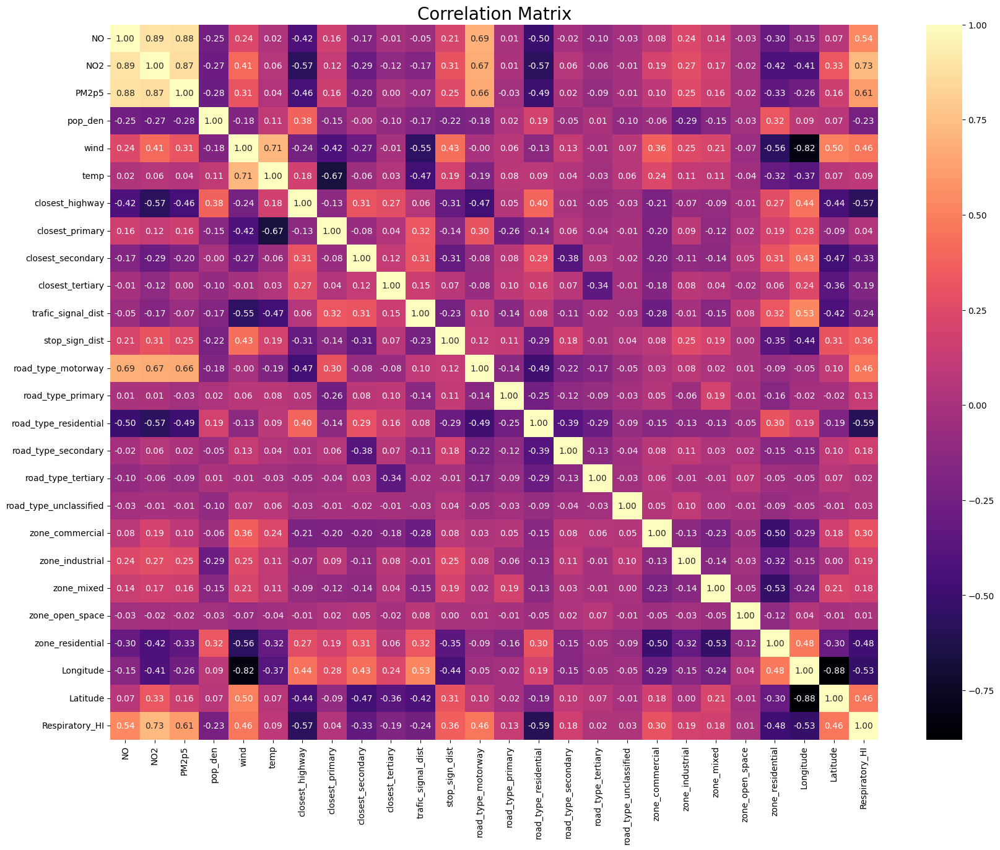

In [ ]:
f, ax = plt.subplots(figsize= [20,15])
sns.heatmap(df_vis[numerical].corr(), annot=True, fmt=".2f", ax=ax, cmap = "magma" )
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [ ]:
Corr = pd.DataFrame(df_vis[numerical].corr()['Respiratory_HI'].sort_values(ascending=False))
Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
NO2,0.728081
PM2p5,0.613451
NO,0.535749
Latitude,0.462277
road_type_motorway,0.459102
wind,0.458172
stop_sign_dist,0.362814
zone_commercial,0.300532
zone_industrial,0.192210
zone_mixed,0.183287


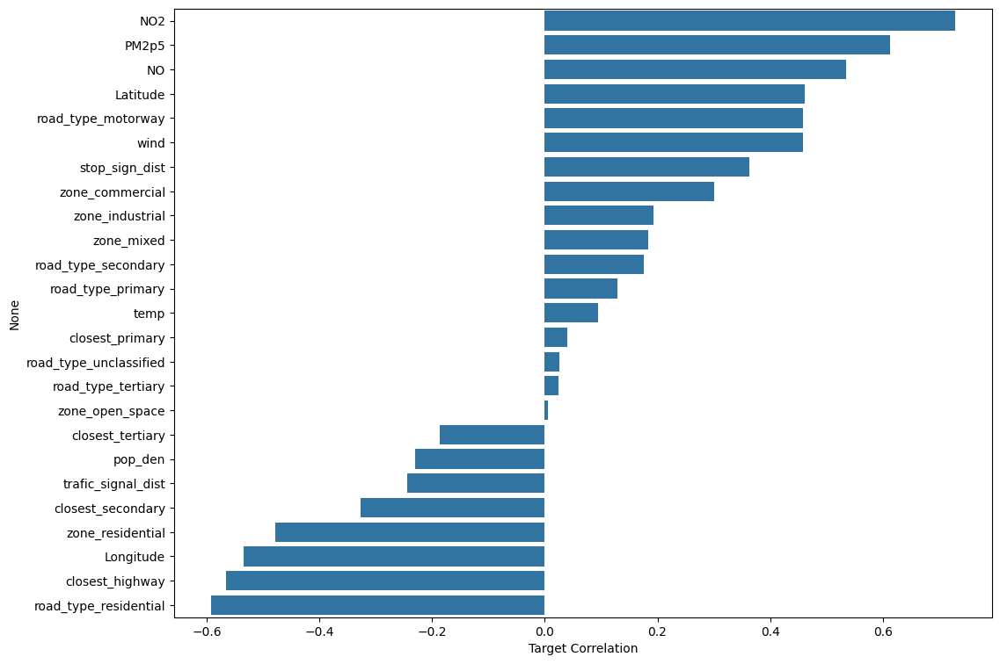

In [ ]:
g0 = sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)
g0.figure.set_size_inches(12, 9)

In [ ]:
gpd_1_vis = gpd_1_city.copy()

## map

Text(0, 0.5, 'Latitude')

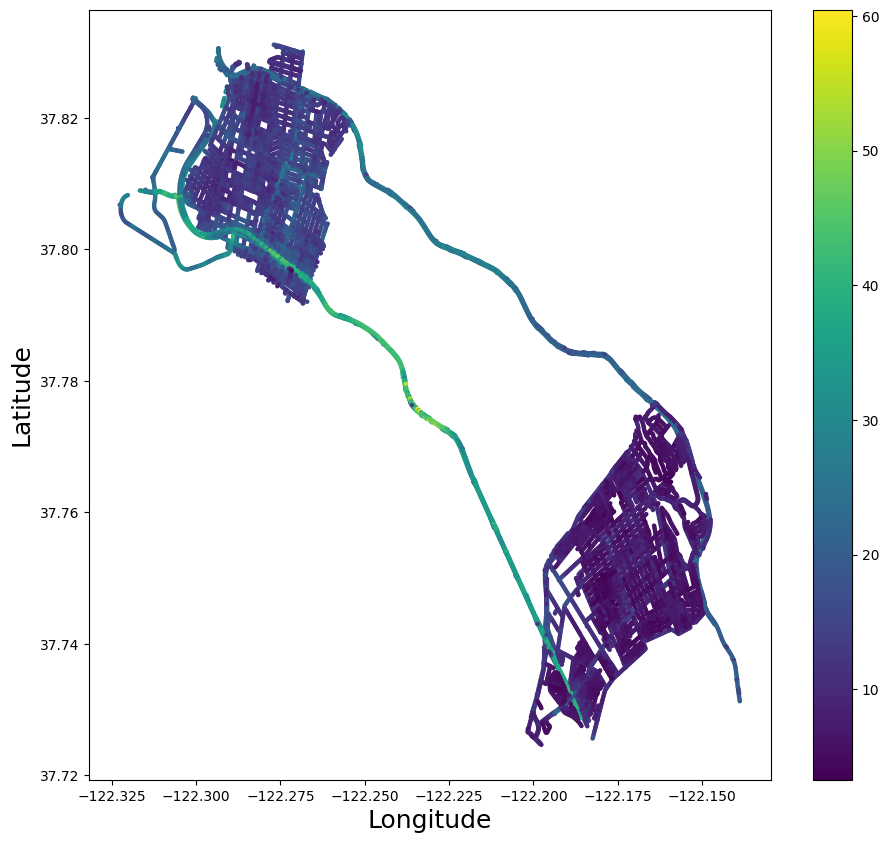

In [ ]:
# Plot the overall heatmap that will go into the web-app
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.NO2)
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

Text(0, 0.5, 'Latitude')

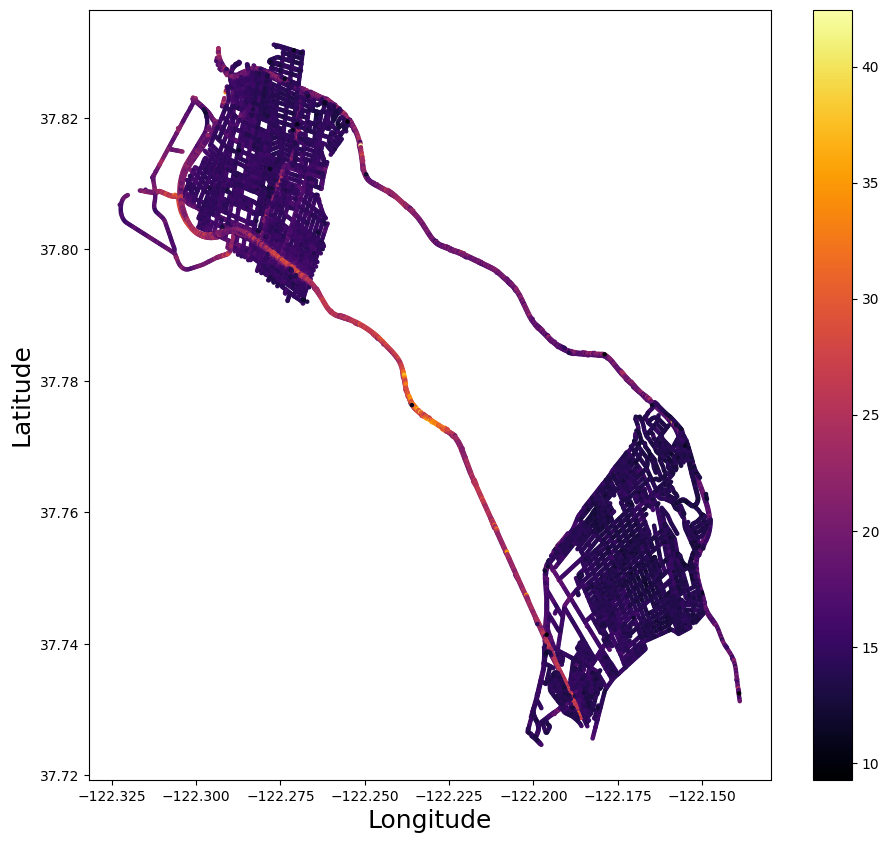

In [ ]:
# Plot the overall heatmap that will go into the web-app
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.PM2p5, cmap='inferno')
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

## boxplot - roads

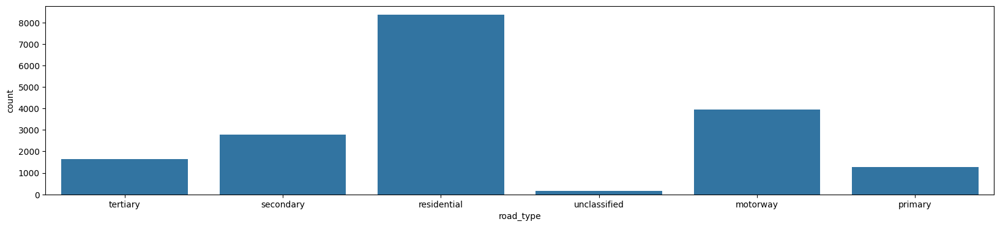

In [ ]:
# Check the sizes of data count
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', data = df_vis);

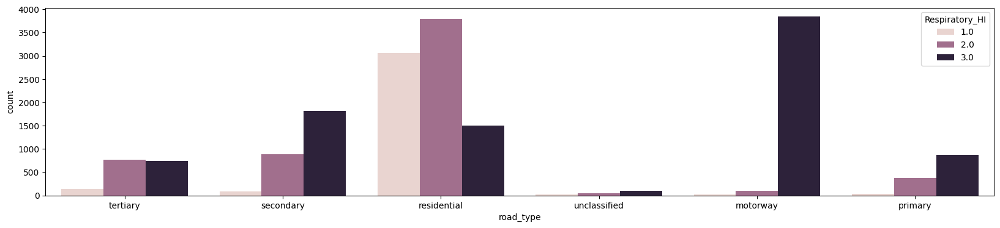

In [ ]:
# Road type & health
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', hue = df_vis['Respiratory_HI'], data = df_vis);

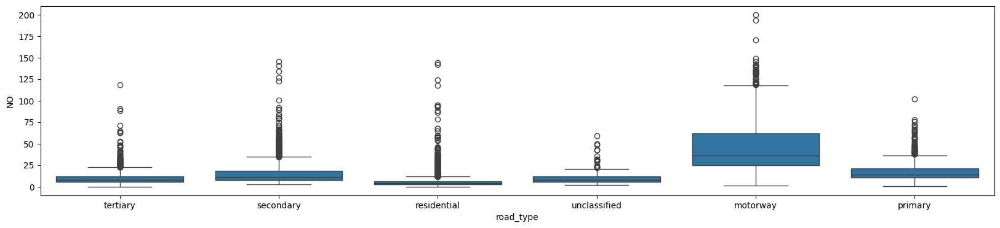

In [ ]:
# NO: road type
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['NO']);

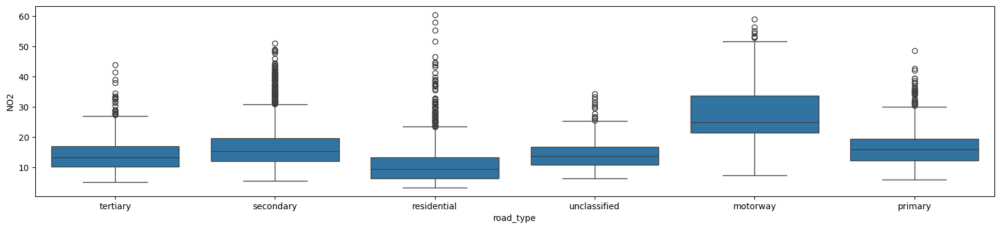

In [ ]:
# NO2: road type
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['NO2']);

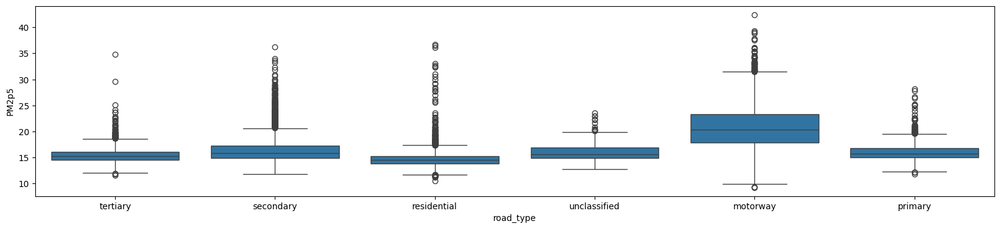

In [ ]:
# PM2.5: road type
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['PM2p5']);

## boxplot - zones

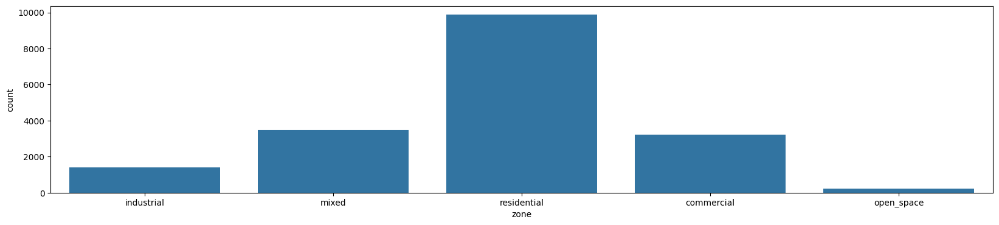

In [ ]:
# Check the sizes of data count
plt.figure(figsize=(20,4))
sns.countplot(x = 'zone', data = df_vis);

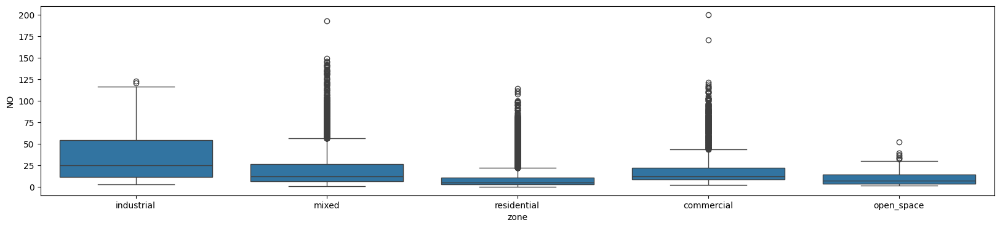

In [ ]:
# NO: zone
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO']);

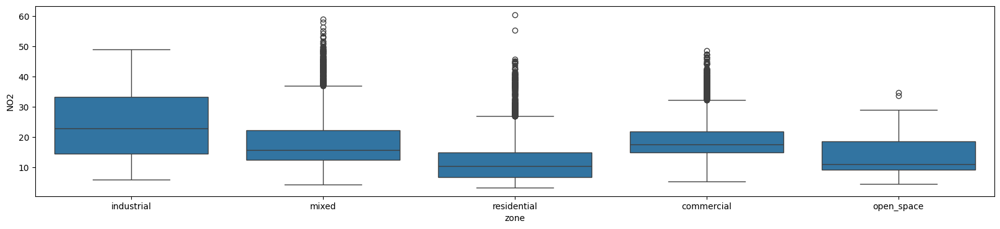

In [ ]:
# NO2: zone
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO2']);

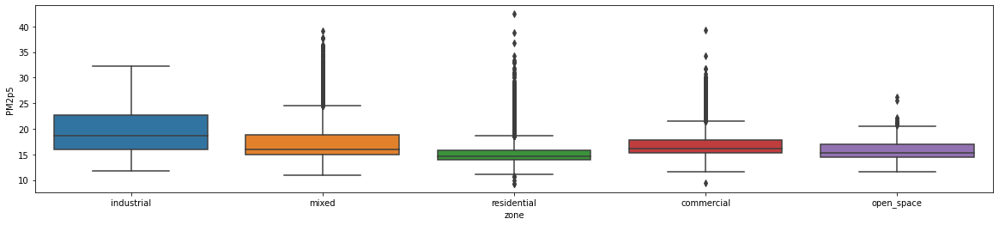

In [ ]:
# PM2.5: zone
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['PM2p5']);

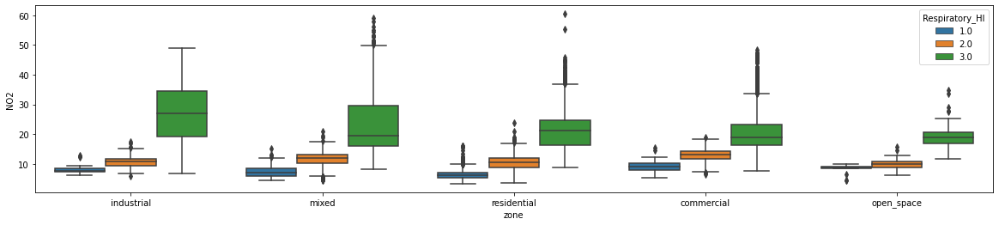

In [ ]:
# NO2: zone & health
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO2'], hue = df_vis['Respiratory_HI']);

## distance

Text(0, 0.5, 'PM2.5 (ug/m3)')

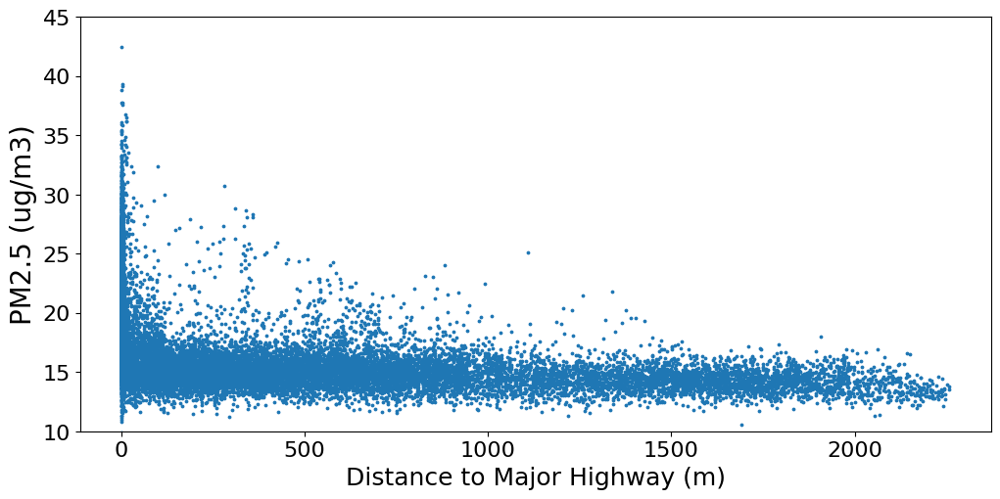

In [ ]:
# PM2p5
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['closest_highway'], df_vis['PM2p5'], s=3)
plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to Major Highway (m)', fontsize=18); plt.ylabel('PM2.5 (ug/m3)', fontsize=20)
# plt.savefig('highway_distance.png', format='png', dpi=300)

# 6.Model

In [ ]:
df_model = df_vis.copy()

In [ ]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')


def pred_summary(pred, ytest, limit = 200):
    """Plotting for test set predictions"""
    sns.scatterplot(pred, ytest)
    abline(1, 0) #1-1 line
    plt.ylim(0, limit); plt.xlim(0, limit)
    plt.tick_params(labelsize=18)

    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))



def plot_corr(df, size=10, MI = False):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''
    if MI == False:
        corr = df.corr()
    else:
        K = df.shape[1]
        corr = np.empty((K, K), dtype=float)

        for i, ac in enumerate(X.columns):
            for j, bc in enumerate(X.columns):
                MI = mutual_information(X.loc[:, ac], X.loc[:, bc], bins=10, normalize=True)
                corr[i, j] = MI

    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);

## Feature selection

In [ ]:
df_model[numerical].columns

Index(['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway',
       'closest_primary', 'closest_secondary', 'closest_tertiary',
       'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway',
       'road_type_primary', 'road_type_residential', 'road_type_secondary',
       'road_type_tertiary', 'road_type_unclassified', 'zone_commercial',
       'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential',
       'Longitude', 'Latitude', 'Respiratory_HI'],
      dtype='object')

In [ ]:
X = df_model[numerical].drop(['Respiratory_HI', 'Longitude','Latitude', 'road_type_unclassified','NO', 'NO2', 'PM2p5'], axis=1)

X.columns

Index(['pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary',
       'closest_secondary', 'closest_tertiary', 'trafic_signal_dist',
       'stop_sign_dist', 'road_type_motorway', 'road_type_primary',
       'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
       'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space',
       'zone_residential'],
      dtype='object')

## Model Selection

## Train-Test Split & Feature Scaling

In [ ]:
# NO
y_NO = df_model['NO']

# NO Split the Data
X_train_NO, X_test_NO, y_train_NO, y_test_NO = model_selection.train_test_split(X, y_NO, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_NO.shape[0]) + ' observation with ' + str(X_train_NO.shape[1]) + ' features')
print('test data has ' + str(X_test_NO.shape[0]) + ' observation with ' + str(X_test_NO.shape[1]) + ' features')


# # Feature Scaling
# scaler = StandardScaler()                               # initialize the class and call it scaler
# scaler.fit(X_train_NO)                                  # fit = training data, means recalculating the data to have a mean of 0 and a std of 1 (btw, normalization typicallu means rescales the values into a range of [0,1])
# X_train_NO = scaler.transform(X_train_NO)               # apply above-calculated mean&std to standardize X_train data
# X_test_NO = scaler.transform(X_test_NO)                 # apply above-calculated min&std to X_test data (testing data could only use parameters from training data)

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


In [ ]:
# NO2
y_NO2 = df_model['NO2']


# NO2 Split the Data
X_train_NO2, X_test_NO2, y_train_NO2, y_test_NO2 = model_selection.train_test_split(X, y_NO2, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_NO2.shape[0]) + ' observation with ' + str(X_train_NO2.shape[1]) + ' features')
print('test data has ' + str(X_test_NO2.shape[0]) + ' observation with ' + str(X_test_NO2.shape[1]) + ' features')


# # Feature Scaling
# scaler = StandardScaler()
# scaler.fit(X_train_NO2)
# X_train_NO2 = scaler.transform(X_train_NO2)
# X_test_NO2 = scaler.transform(X_test_NO2)

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


In [ ]:
y_PM = df_model['PM2p5']


# NO2 Split the Data
X_train_PM, X_test_PM, y_train_PM, y_test_PM = model_selection.train_test_split(X, y_PM, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_PM.shape[0]) + ' observation with ' + str(X_train_PM.shape[1]) + ' features')
print('test data has ' + str(X_test_PM.shape[0]) + ' observation with ' + str(X_test_PM.shape[1]) + ' features')


# # Feature Scaling
# scaler = StandardScaler()
# scaler.fit(X_train_PM)
# X_train_PM = scaler.transform(X_train_PM)
# X_test_PM = scaler.transform(X_test_PM)

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


## NO2

### ensemble learning - Bagging

In [ ]:
# Use the same random forest gridsearch as above
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [150, 200]}

forest_grid_no2 = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
# Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid_no2.best_score_)))
print(forest_grid_no2.best_estimator_)

Best score (RMSE) 2.2837839929311925
RandomForestRegressor(max_features=10, n_estimators=200, n_jobs=2)


Text(0, 0.5, 'Observed NO$_2$')

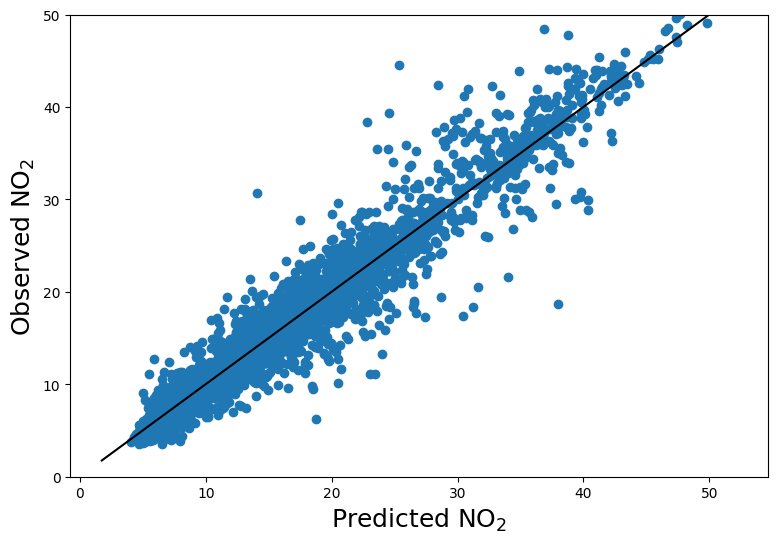

In [ ]:
fig = plt.figure(figsize=(9,6))
forest_out_no2 = forest_grid_no2.predict(X_test_NO2)
plt.scatter(forest_out_no2, y_test_NO2) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.ylim(0, 50)  # Set the y-axis limit
plt.xlabel('Predicted NO$_2$', fontsize=18)
plt.ylabel('Observed NO$_2$', fontsize=18)

In [ ]:
FI_rf = pd.DataFrame(forest_grid_no2.best_estimator_.feature_importances_, index=X_train_NO2.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf # major factor identification

,Feature Importance (RF)
closest_highway,0.328954
road_type_motorway,0.142904
wind,0.140388
road_type_residential,0.062442
temp,0.061229
pop_den,0.045760
closest_primary,0.039583
zone_residential,0.037817
closest_tertiary,0.033166
closest_secondary,0.032833


### ensemble learning - Boosting

In [ ]:
# Use the same random forest gridsearch as above
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}

gb_forest_grid_no2 = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_no2.best_score_)))
print(gb_forest_grid_no2.best_estimator_)

Best score (RMSE) 2.9513633653718494
GradientBoostingRegressor(learning_rate=0.5, max_features=6, n_estimators=200)


Text(0, 0.5, 'Observed NO$_2$')

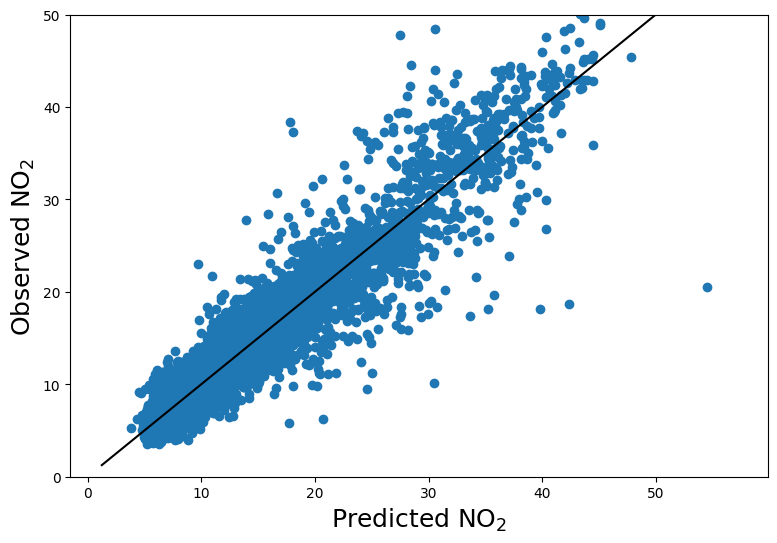

In [ ]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_no2 = gb_forest_grid_no2.predict(X_test_NO2)
plt.scatter(gb_forest_out_no2, y_test_NO2) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.ylim(0, 50)  # Set the y-axis limit
plt.xlabel('Predicted NO$_2$', fontsize=18)
plt.ylabel('Observed NO$_2$', fontsize=18)

In [ ]:
FI_gb = pd.DataFrame(gb_forest_grid_no2.best_estimator_.feature_importances_, index=X_train_NO2.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
road_type_residential,0.265022
road_type_motorway,0.215370
wind,0.140057
closest_highway,0.114433
pop_den,0.102360
closest_secondary,0.028114
zone_residential,0.023475
closest_tertiary,0.020164
closest_primary,0.019742
stop_sign_dist,0.016452


In [ ]:
# shap values
# pos/neg values of each imp features
# https://github.com/shap/shap

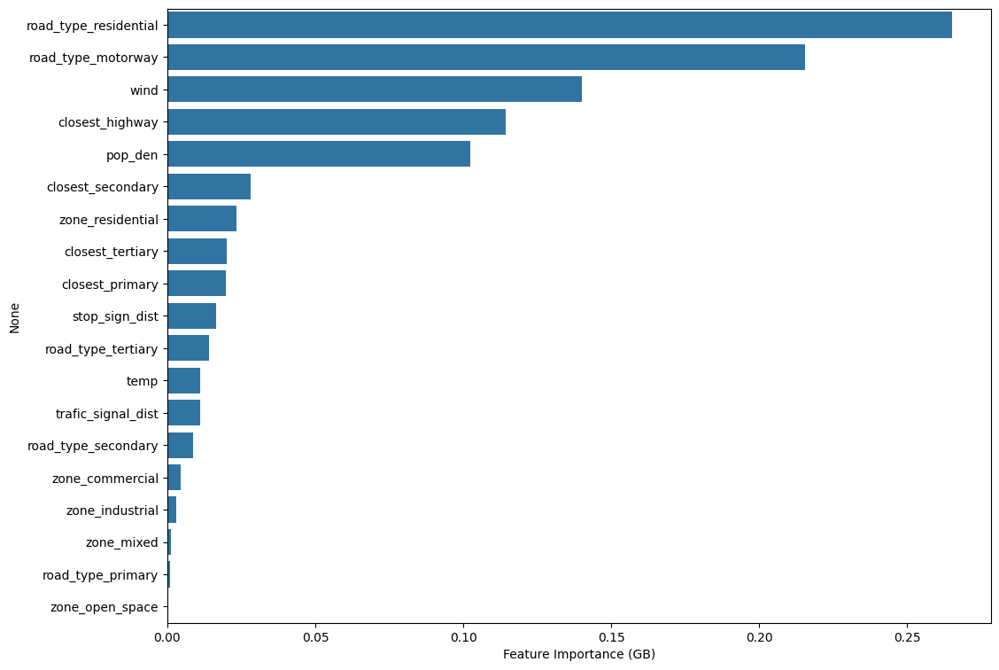

In [ ]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation Importance

In [ ]:
# (1) Set the best parameters from hyperparameter tuning
grid_search_best_no2 = forest_grid_no2.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_no2.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 10,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [ ]:
# (2) Permutation Importance - Random Forest
PI_no2 = permutation_importance(grid_search_best_no2, X_test_NO2, y_test_NO2, n_repeats=5, random_state=1)



PI_res = pd.DataFrame(data=np.transpose([PI_no2['importances_mean'],PI_no2['importances_std']]),
             index = X_test_NO2.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.560923,0.003945
wind,0.263509,0.001900
road_type_motorway,0.090137,0.000932
temp,0.082935,0.001208
closest_primary,0.050761,0.001378
pop_den,0.048096,0.002000
closest_secondary,0.039939,0.002056
road_type_residential,0.037368,0.000698
stop_sign_dist,0.035831,0.001617
closest_tertiary,0.027581,0.001001


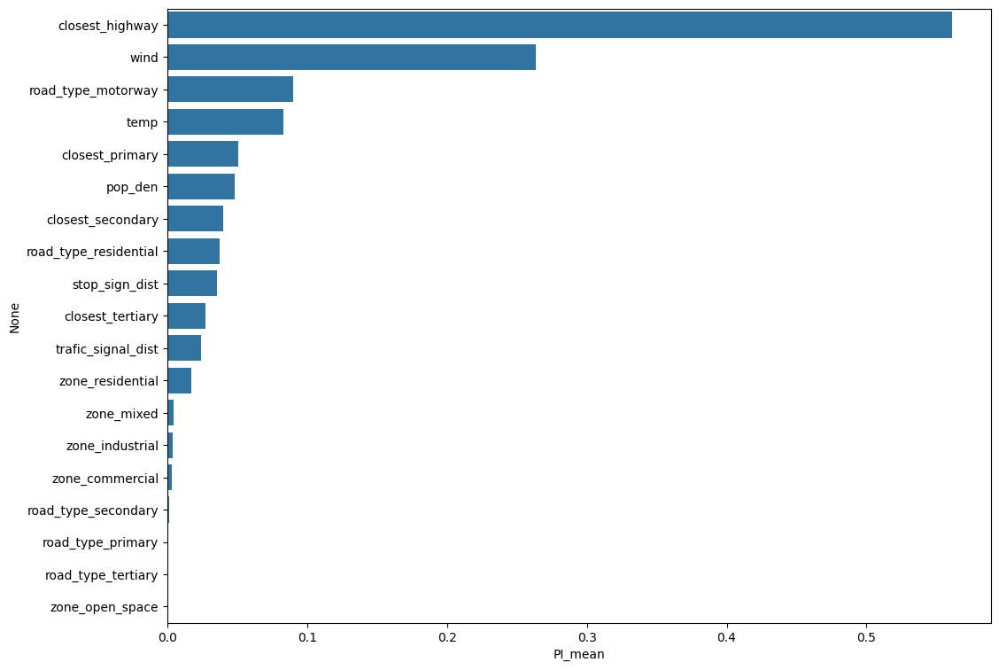

In [ ]:
g1 = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g1.figure.set_size_inches(12, 9)

### result summary

In [ ]:
# Summary

summary_0 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_0

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,road_type_residential,closest_highway
1,road_type_motorway,road_type_motorway,wind
2,wind,wind,road_type_motorway
3,road_type_residential,closest_highway,temp
4,temp,pop_den,closest_primary
5,pop_den,closest_secondary,pop_den
6,closest_primary,zone_residential,closest_secondary
7,zone_residential,closest_tertiary,road_type_residential
8,closest_tertiary,closest_primary,stop_sign_dist
9,closest_secondary,stop_sign_dist,closest_tertiary


## NO

### Ensemble learning - Bagging

In [ ]:
forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [150, 200]}

forest_grid = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid.best_score_)))
print(forest_grid.best_estimator_)

Best score (RMSE) 6.461229782940839
RandomForestRegressor(max_features=8, n_estimators=200, n_jobs=2)


Text(0, 0.5, 'Observed NO')

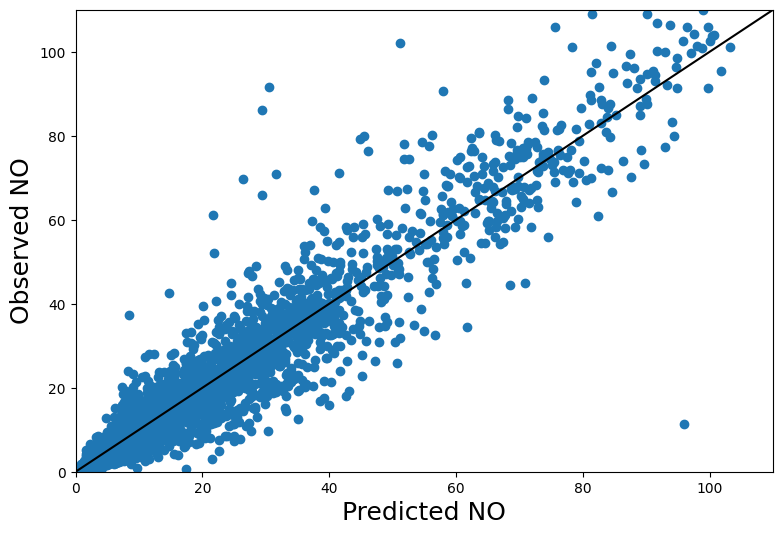

In [ ]:
fig = plt.figure(figsize=(9,6))
forest_NO = forest_grid.predict(X_test_NO)
plt.scatter(forest_NO, y_test_NO) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.ylim(0, 110)  # Set the y-axis limit
plt.xlim(0, 110)  # Set the y-axis limit
plt.xlabel('Predicted NO', fontsize=18)
plt.ylabel('Observed NO', fontsize=18)

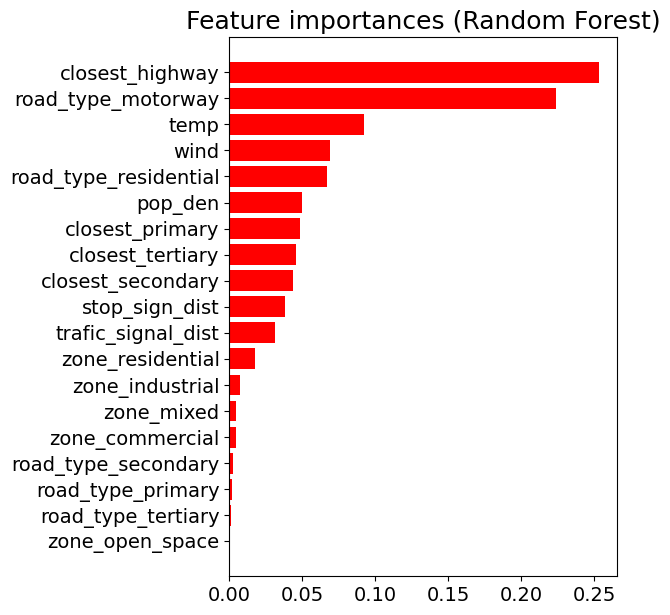

In [ ]:
features = X_train_NO.columns
importance = forest_grid.best_estimator_.feature_importances_
indices = np.argsort(importance)
plt.figure(figsize=(5, 7))
plt.title("Feature importances (Random Forest)", fontsize = 18)
plt.barh(features[indices], importance[indices],
       color="r",  align="center")
plt.tick_params(labelsize=14);

### Ensemble learning - Boosting

In [ ]:
# Use the same random forest gridsearch as above
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}

gb_forest_grid_no = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_no.best_score_)))
print(gb_forest_grid_no.best_estimator_)

Best score (RMSE) 8.082612534570462
GradientBoostingRegressor(learning_rate=0.5, max_features=6, n_estimators=200)


Text(0, 0.5, 'Observed NO')

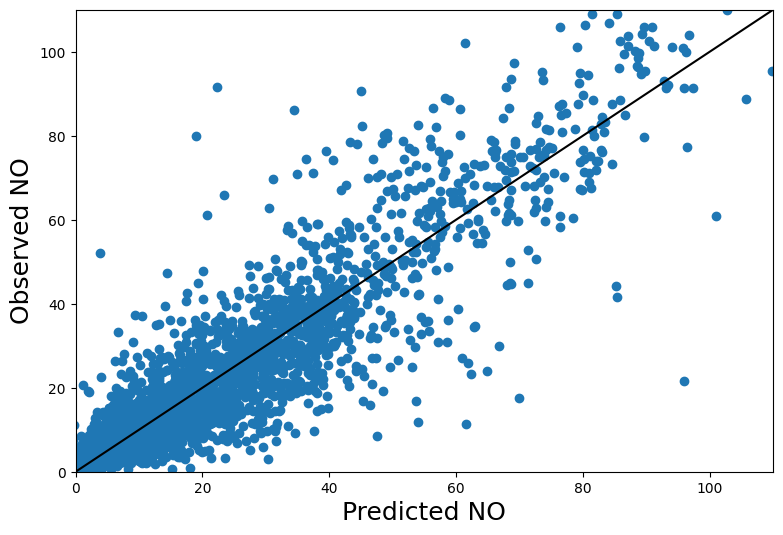

In [ ]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_no = gb_forest_grid_no.predict(X_test_NO)
plt.scatter(gb_forest_out_no, y_test_NO) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.xlim(0, 110)  # Set the y-axis limit
plt.ylim(0, 110)  # Set the y-axis limit
plt.xlabel('Predicted NO', fontsize=18)
plt.ylabel('Observed NO', fontsize=18)

In [ ]:
FI_gb = pd.DataFrame(gb_forest_grid_no.best_estimator_.feature_importances_, index=X_train_NO.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
road_type_motorway,0.405606
closest_highway,0.189762
wind,0.113573
pop_den,0.070077
road_type_residential,0.036883
closest_tertiary,0.035912
temp,0.035796
closest_primary,0.024072
stop_sign_dist,0.022294
zone_industrial,0.020534


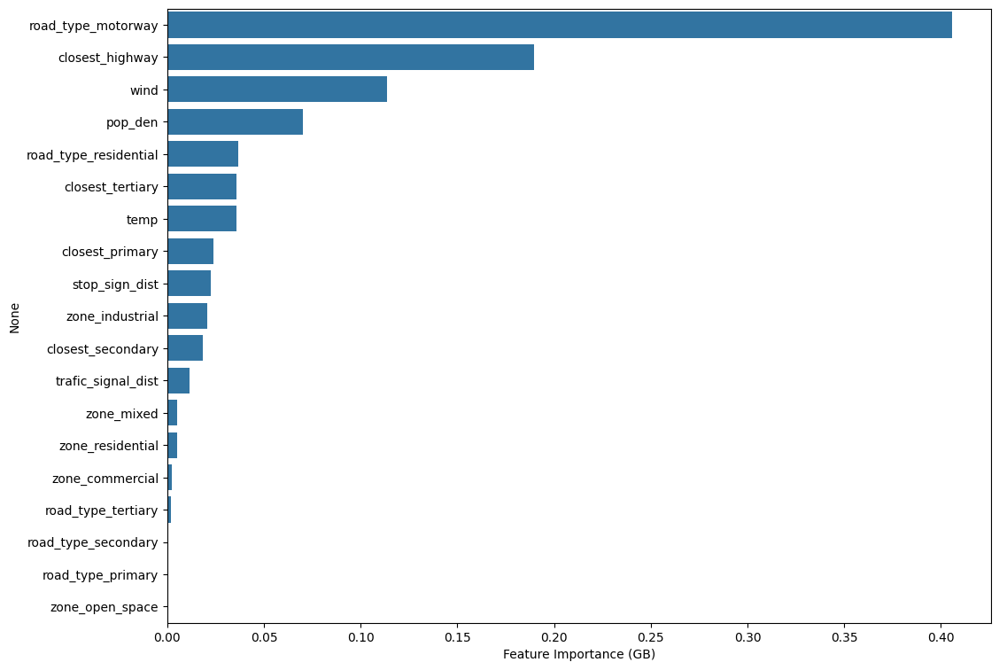

In [ ]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation importance

In [ ]:
# (1) Set the best parameters from hyperparameter tuning
grid_search_best_no = gb_forest_grid_no.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_no.get_params())

Parameters currently in use:

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.5,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': 6,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}


In [ ]:
# (2) Permutation Importance - Random Forest
PI_no = permutation_importance(grid_search_best_no, X_test_NO, y_test_NO, n_repeats=5, random_state=1)



PI_res = pd.DataFrame(data=np.transpose([PI_no['importances_mean'],PI_no['importances_std']]),
             index = X_test_NO.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.310257,0.004822
road_type_motorway,0.257809,0.005710
wind,0.158405,0.006068
pop_den,0.133042,0.003315
temp,0.115485,0.005811
closest_primary,0.069096,0.002746
stop_sign_dist,0.066944,0.002989
closest_secondary,0.063888,0.005501
closest_tertiary,0.041816,0.000841
road_type_residential,0.035301,0.002129


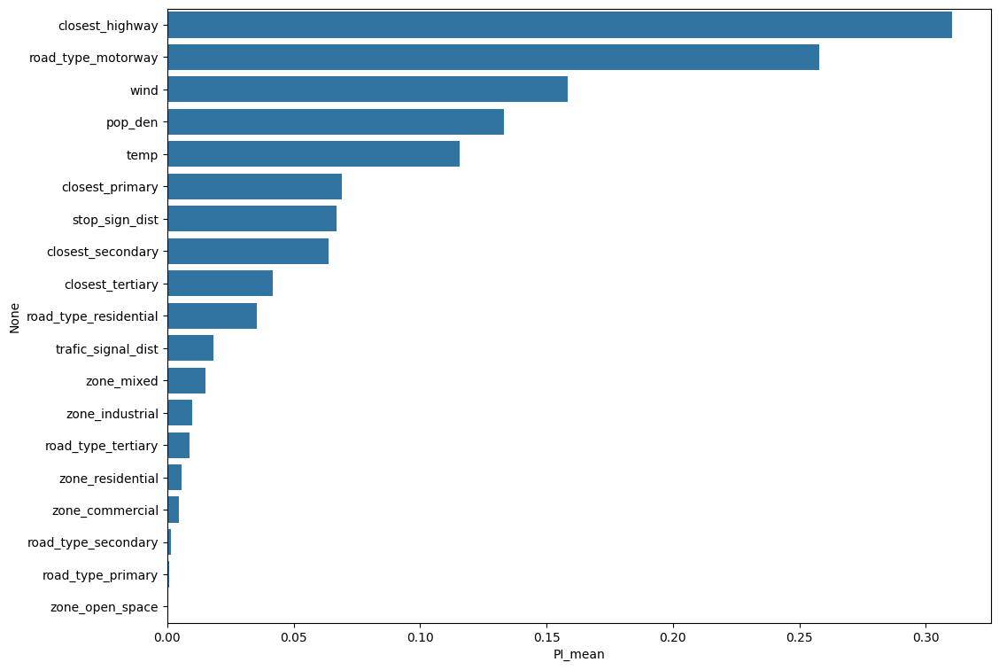

In [ ]:
g1 = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g1.figure.set_size_inches(12, 9)

### result summary

In [ ]:
# Summary

summary_0 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_0

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,road_type_motorway,closest_highway
1,road_type_motorway,closest_highway,road_type_motorway
2,wind,wind,wind
3,road_type_residential,pop_den,pop_den
4,temp,road_type_residential,temp
5,pop_den,closest_tertiary,closest_primary
6,closest_primary,temp,stop_sign_dist
7,zone_residential,closest_primary,closest_secondary
8,closest_tertiary,stop_sign_dist,closest_tertiary
9,closest_secondary,zone_industrial,road_type_residential


## PM2.5

### Ensemble learning - Bagging

In [ ]:
# Use the same random forest gridsearch as above
forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [150, 200, 250]}

forest_grid_pm = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200, 250]},
             scoring='neg_mean_squared_error')

In [ ]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid_pm.best_score_)))
print(forest_grid_pm.best_estimator_)

Best score (RMSE) 1.391721250936114
RandomForestRegressor(max_features=8, n_estimators=150, n_jobs=2)


Text(0, 0.5, 'Observed PM')

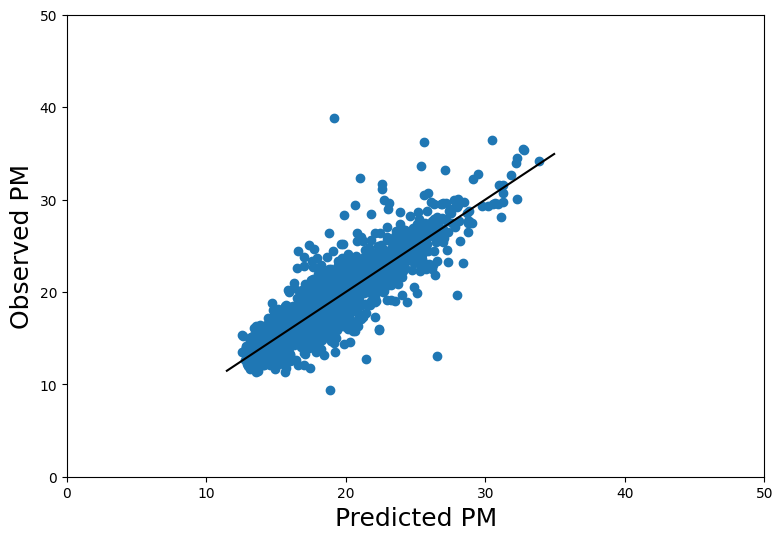

In [ ]:
fig = plt.figure(figsize=(9,6))
forest_out_pm = forest_grid_pm.predict(X_test_PM)
plt.scatter(forest_out_pm, y_test_PM) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.xlim(0, 50)  # Set the y-axis limit
plt.ylim(0, 50)  # Set the y-axis limit
plt.xlabel('Predicted PM', fontsize=18)
plt.ylabel('Observed PM', fontsize=18)

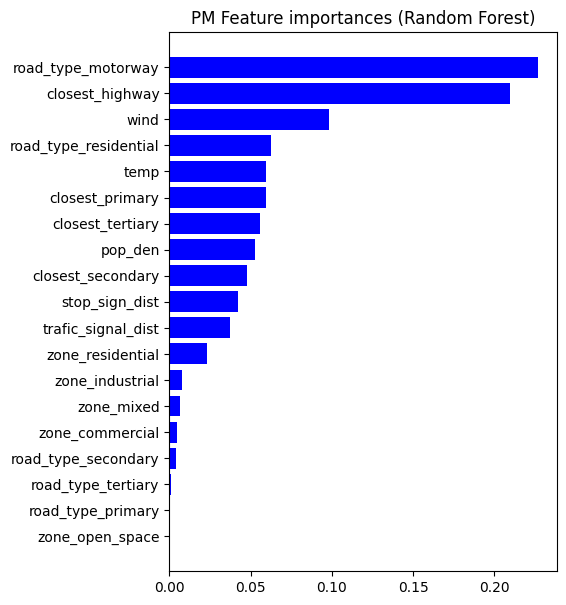

In [ ]:
features = X.columns
importance = forest_grid_pm.best_estimator_.feature_importances_
indices = np.argsort(importance)
plt.figure(figsize=(5, 7))
plt.title("PM Feature importances (Random Forest)")
plt.barh(features[indices], importance[indices],
       color="b",  align="center");

### Ensemble learning - Boosting

In [ ]:
# Use the same random forest gridsearch as above
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}

gb_forest_grid_pm = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_pm.best_score_)))
print(gb_forest_grid_pm.best_estimator_)

Best score (RMSE) 1.5974260399630587
GradientBoostingRegressor(learning_rate=0.5, max_features=8, n_estimators=200)


Text(0, 0.5, 'Observed PM')

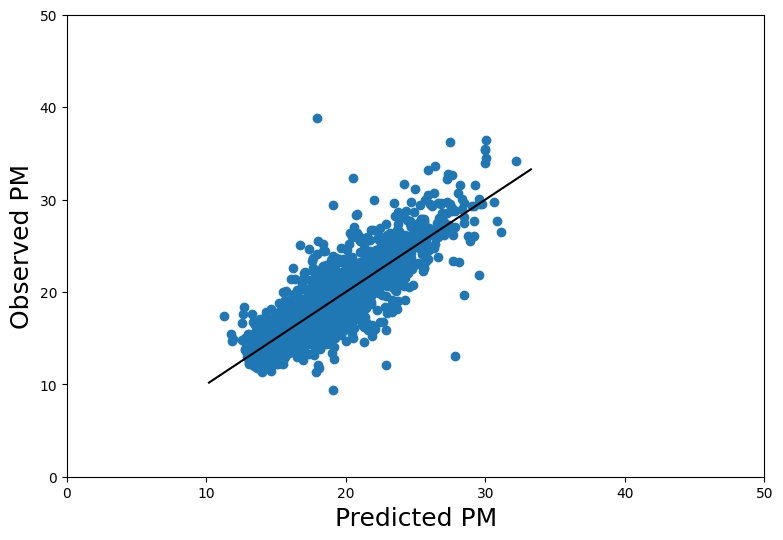

In [ ]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_pm = gb_forest_grid_pm.predict(X_test_PM)
plt.scatter(gb_forest_out_pm, y_test_PM) # Create a scatterplot
abline(1, 0)  # Add a 1:1 line
plt.xlim(0, 50)  # Set the y-axis limit
plt.ylim(0, 50)  # Set the y-axis limit
plt.xlabel('Predicted PM', fontsize=18)
plt.ylabel('Observed PM', fontsize=18)

In [ ]:
FI_gb = pd.DataFrame(gb_forest_grid_pm.best_estimator_.feature_importances_, index=X_train_PM.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
closest_highway,0.328104
road_type_residential,0.234077
wind,0.104374
temp,0.080263
pop_den,0.068786
closest_tertiary,0.042310
stop_sign_dist,0.035606
closest_primary,0.029201
closest_secondary,0.025855
road_type_motorway,0.015372


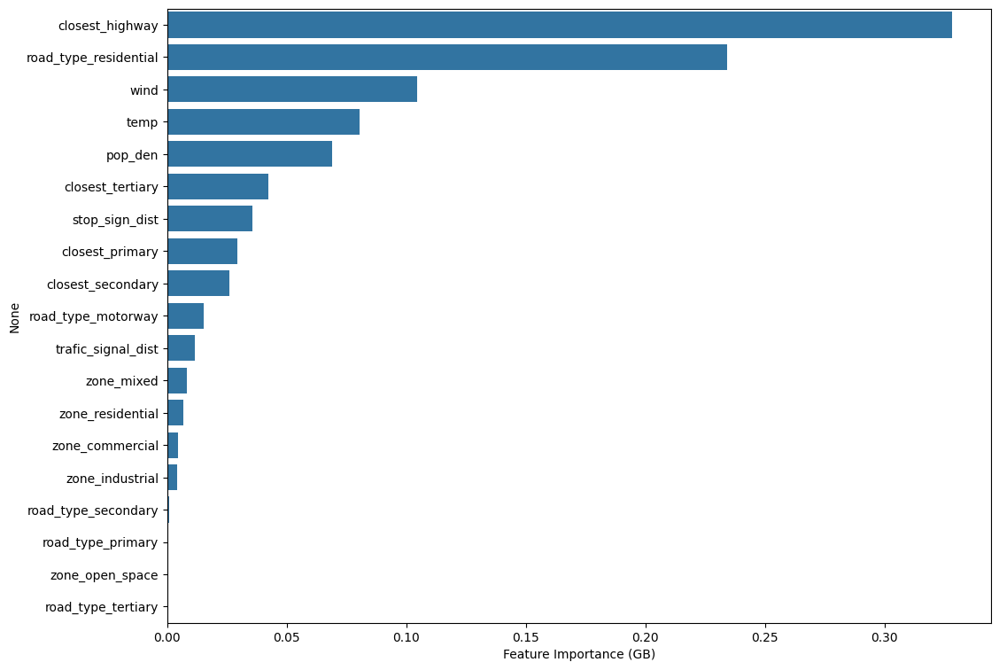

In [ ]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation importance

In [ ]:
# (1) Set the best parameters from hyperparameter tuning
grid_search_best_pm = gb_forest_grid_pm.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_pm.get_params())

Parameters currently in use:

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.5,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': 8,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}


In [ ]:
# (2) Permutation Importance - Random Forest
PI_pm = permutation_importance(grid_search_best_pm, X_test_PM, y_test_PM, n_repeats=5, random_state=1)



PI_res = pd.DataFrame(data=np.transpose([PI_pm['importances_mean'],PI_pm['importances_std']]),
             index = X_test_PM.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.381842,0.005238
temp,0.199565,0.007673
wind,0.170831,0.006782
pop_den,0.131159,0.007132
closest_primary,0.117265,0.002410
stop_sign_dist,0.081664,0.004050
road_type_motorway,0.079223,0.002462
closest_tertiary,0.062870,0.003876
road_type_residential,0.056604,0.002784
closest_secondary,0.052793,0.004277


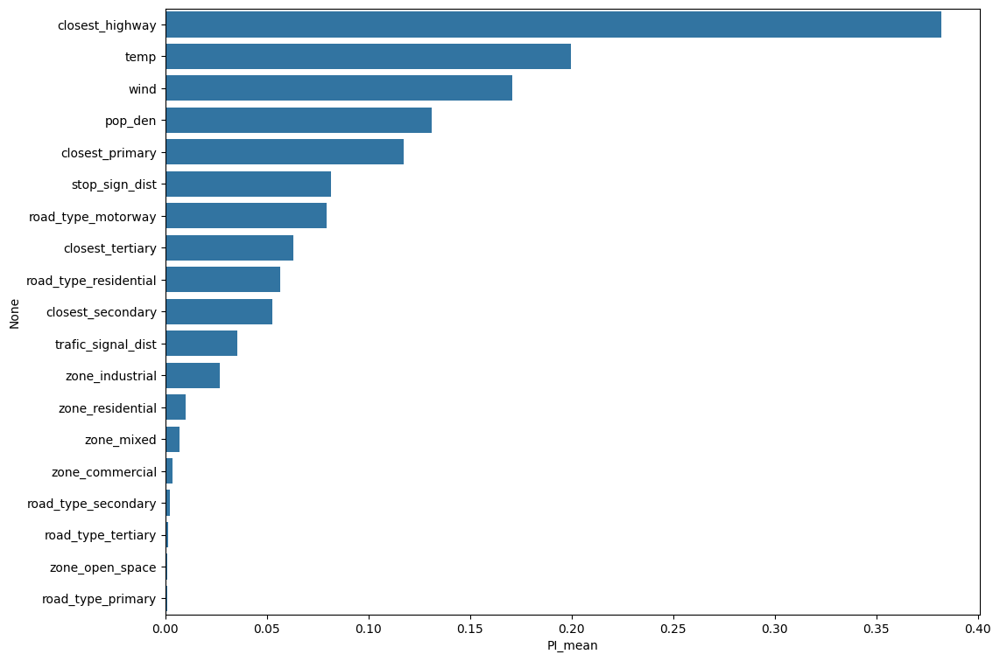

In [ ]:
g1 = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g1.figure.set_size_inches(12, 9)

### result summary

In [ ]:
# Summary

summary_0 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_0

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,closest_highway,closest_highway
1,road_type_motorway,road_type_residential,temp
2,wind,wind,wind
3,road_type_residential,temp,pop_den
4,temp,pop_den,closest_primary
5,pop_den,closest_tertiary,stop_sign_dist
6,closest_primary,stop_sign_dist,road_type_motorway
7,zone_residential,closest_primary,closest_tertiary
8,closest_tertiary,closest_secondary,road_type_residential
9,closest_secondary,road_type_motorway,closest_secondary
